# Proyek Analisis Data: Air Quality Dataset
- **Nama:** Rahma Nur Annisa
- **Email:** rahmanurannisa@mail.ugm.ac.id
- **ID Dicoding:** MC008D5X0402

## Menentukan Pertanyaan Bisnis

- Bagaimana perbandingan tren polusi udara di berbagai stasiun?
- Apakah ada pola tertentu kelembaban udara berdasarkan lokasi geografis?

## Import Semua Packages/Library yang Digunakan

In [1]:
import zipfile
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import warnings
import glob
import folium
from folium.plugins import HeatMap
warnings.filterwarnings('ignore')

## Data Wrangling

### Gathering Data

In [3]:
# Path ke file ZIP
zip_path = "/content/Air-quality-dataset.zip"
extract_path = "/content/air_quality_data"

# Ekstrak file ZIP
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Cek file yang diekstrak
files = os.listdir(extract_path)
print(f"Files in extracted folder: {files}")

Files in extracted folder: ['PRSA_Data_20130301-20170228']


In [4]:
data_folder = "/content/air_quality_data/PRSA_Data_20130301-20170228"

# Cari semua file CSV dalam subfolder
csv_files = glob.glob(os.path.join(data_folder, "*.csv"))

# Gabungkan semua file CSV menjadi satu DataFrame
df_list = [pd.read_csv(file) for file in csv_files]
df_combined = pd.concat(df_list, ignore_index=True)

In [5]:
 # Dictionary koordinat berdasarkan wilayah (data diperoleh dari sumber external)
station_locations = {
    "Aotizhongxin": [41.7445, 123.4566],
    "Changping": [40.0894, 116.3031],
    "Dingling": [40.2959, 116.2235],
    "Dongsi": [39.9320, 116.4341],
    "Guanyuan": [32.4361, 105.8439],
    "Gucheng": [26.8771, 100.2257],
    "Huairou": [40.3971, 116.6878],
    "Nongzhanguan": [39.9470, 116.4703],
    "Shunyi": [40.0577, 116.8665],
    "Tiantan": [39.8822, 116.4066],
    "Wanliu": [39.9977, 116.2576],
    "Wanshouxigong": [39.8673, 116.3660],
    }
# Tambahkan koordinat ke dataset
df_combined["latitude"] = df_combined["station"].map(lambda x: station_locations.get(x, [None, None])[0])
df_combined["longitude"] = df_combined["station"].map(lambda x: station_locations.get(x, [None, None])[1])


In [6]:
# preview data
print(df_combined.head())

   No  year  month  day  hour  PM2.5  PM10   SO2   NO2     CO    O3  TEMP  \
0   1  2013      3    1     0    4.0   4.0  14.0  20.0  300.0  69.0  -0.7   
1   2  2013      3    1     1    4.0   4.0  13.0  17.0  300.0  72.0  -1.1   
2   3  2013      3    1     2    3.0   3.0  10.0  19.0  300.0  69.0  -1.1   
3   4  2013      3    1     3    3.0   6.0   7.0  24.0  400.0  62.0  -1.4   
4   5  2013      3    1     4    3.0   6.0   5.0  14.0  400.0  71.0  -2.0   

     PRES  DEWP  RAIN   wd  WSPM   station  latitude  longitude  
0  1023.0 -18.8   0.0  NNW   4.4  Guanyuan   32.4361   105.8439  
1  1023.2 -18.2   0.0    N   4.7  Guanyuan   32.4361   105.8439  
2  1023.5 -18.2   0.0  NNW   5.6  Guanyuan   32.4361   105.8439  
3  1024.5 -19.4   0.0   NW   3.1  Guanyuan   32.4361   105.8439  
4  1025.2 -19.5   0.0    N   2.0  Guanyuan   32.4361   105.8439  


In [41]:
df_combined

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,latitude,longitude,datetime
0,1,2013,3,1,0,4.0,4.0,14.0,20.0,300.0,...,-0.7,1023.0,-18.8,0.0,NNW,4.4,Guanyuan,32.4361,105.8439,2013-03-01 00:00:00
1,2,2013,3,1,1,4.0,4.0,13.0,17.0,300.0,...,-1.1,1023.2,-18.2,0.0,N,4.7,Guanyuan,32.4361,105.8439,2013-03-01 01:00:00
2,3,2013,3,1,2,3.0,3.0,10.0,19.0,300.0,...,-1.1,1023.5,-18.2,0.0,NNW,5.6,Guanyuan,32.4361,105.8439,2013-03-01 02:00:00
3,4,2013,3,1,3,3.0,6.0,7.0,24.0,400.0,...,-1.4,1024.5,-19.4,0.0,NW,3.1,Guanyuan,32.4361,105.8439,2013-03-01 03:00:00
4,5,2013,3,1,4,3.0,6.0,5.0,14.0,400.0,...,-2.0,1025.2,-19.5,0.0,N,2.0,Guanyuan,32.4361,105.8439,2013-03-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420763,35060,2017,2,28,19,27.0,72.0,8.0,92.0,800.0,...,10.3,1014.2,-12.4,0.0,W,1.8,Shunyi,40.0577,116.8665,2017-02-28 19:00:00
420764,35061,2017,2,28,20,47.0,55.0,17.0,86.0,1100.0,...,9.8,1014.5,-9.9,0.0,NW,1.5,Shunyi,40.0577,116.8665,2017-02-28 20:00:00
420765,35062,2017,2,28,21,18.0,28.0,4.0,30.0,500.0,...,9.1,1014.6,-12.7,0.0,NE,1.7,Shunyi,40.0577,116.8665,2017-02-28 21:00:00
420766,35063,2017,2,28,22,18.0,20.0,9.0,33.0,500.0,...,7.1,1015.2,-13.2,0.0,WNW,1.8,Shunyi,40.0577,116.8665,2017-02-28 22:00:00


In [ ]:
# Simpan hasil gabungan ke file CSV baru
df_combined.to_csv("/content/air_quality_combined.csv", index=False)
print("File gabungan telah disimpan sebagai air_quality_combined.csv")

File gabungan telah disimpan sebagai air_quality_combined.csv


**Insight:**
- Data yang digunakan yakni Air Quality Dataset yang terdiri dari 12 file csv, berisi data kualitas udara dari 12 stasiun pemantauan yang berbeda di China.
- Data mencakup periode Maret 2013 hingga Februari 2017.
- Dilakukan pembuatan variabel datetime berdasarkan variabel-variabel yang mewakili waktu.
- Untuk analisis spasial yang lebih baik, diperlukan informasi koordinat geografis (latitude dan longitude) dari setiap stasiun. Data koordinat diperoleh dari google maps sesuai dengan lokasi stasiun pemantauan.
- Dataset keseluruhan yang telah digabungkan memiliki 420768 baris dan 21 kolom, mencakup variabel waktu, kualitas polutan, kelembaban, tekanan udara, dan faktor meteorologi lainnya.

### Assessing Data

In [7]:
# Informasi umum dataset
print("🔹 INFORMASI DATASET")
print(df_combined.info())

🔹 INFORMASI DATASET
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 20 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   No         420768 non-null  int64  
 1   year       420768 non-null  int64  
 2   month      420768 non-null  int64  
 3   day        420768 non-null  int64  
 4   hour       420768 non-null  int64  
 5   PM2.5      412029 non-null  float64
 6   PM10       414319 non-null  float64
 7   SO2        411747 non-null  float64
 8   NO2        408652 non-null  float64
 9   CO         400067 non-null  float64
 10  O3         407491 non-null  float64
 11  TEMP       420370 non-null  float64
 12  PRES       420375 non-null  float64
 13  DEWP       420365 non-null  float64
 14  RAIN       420378 non-null  float64
 15  wd         418946 non-null  object 
 16  WSPM       420450 non-null  float64
 17  station    420768 non-null  object 
 18  latitude   420768 non-null  float64
 19  lon

In [8]:
# Menampilkan 5 baris pertama
print("\n🔹 5 BARIS PERTAMA DATA")
print(df_combined.head())


🔹 5 BARIS PERTAMA DATA
   No  year  month  day  hour  PM2.5  PM10   SO2   NO2     CO    O3  TEMP  \
0   1  2013      3    1     0    4.0   4.0  14.0  20.0  300.0  69.0  -0.7   
1   2  2013      3    1     1    4.0   4.0  13.0  17.0  300.0  72.0  -1.1   
2   3  2013      3    1     2    3.0   3.0  10.0  19.0  300.0  69.0  -1.1   
3   4  2013      3    1     3    3.0   6.0   7.0  24.0  400.0  62.0  -1.4   
4   5  2013      3    1     4    3.0   6.0   5.0  14.0  400.0  71.0  -2.0   

     PRES  DEWP  RAIN   wd  WSPM   station  latitude  longitude  
0  1023.0 -18.8   0.0  NNW   4.4  Guanyuan   32.4361   105.8439  
1  1023.2 -18.2   0.0    N   4.7  Guanyuan   32.4361   105.8439  
2  1023.5 -18.2   0.0  NNW   5.6  Guanyuan   32.4361   105.8439  
3  1024.5 -19.4   0.0   NW   3.1  Guanyuan   32.4361   105.8439  
4  1025.2 -19.5   0.0    N   2.0  Guanyuan   32.4361   105.8439  


In [9]:
# Menampilkan 5 baris terakhir
print("\n🔹 5 BARIS TERAKHIR DATA")
print(df_combined.tail())


🔹 5 BARIS TERAKHIR DATA
           No  year  month  day  hour  PM2.5  PM10   SO2   NO2      CO    O3  \
420763  35060  2017      2   28    19   27.0  72.0   8.0  92.0   800.0  16.0   
420764  35061  2017      2   28    20   47.0  55.0  17.0  86.0  1100.0  19.0   
420765  35062  2017      2   28    21   18.0  28.0   4.0  30.0   500.0  64.0   
420766  35063  2017      2   28    22   18.0  20.0   9.0  33.0   500.0  59.0   
420767  35064  2017      2   28    23   15.0  22.0  13.0  34.0   500.0  60.0   

        TEMP    PRES  DEWP  RAIN   wd  WSPM station  latitude  longitude  
420763  10.3  1014.2 -12.4   0.0    W   1.8  Shunyi   40.0577   116.8665  
420764   9.8  1014.5  -9.9   0.0   NW   1.5  Shunyi   40.0577   116.8665  
420765   9.1  1014.6 -12.7   0.0   NE   1.7  Shunyi   40.0577   116.8665  
420766   7.1  1015.2 -13.2   0.0  WNW   1.8  Shunyi   40.0577   116.8665  
420767   7.4  1014.9 -11.9   0.0    N   1.4  Shunyi   40.0577   116.8665  


In [10]:
# Cek jumlah missing values per kolom
print("\n🔹 JUMLAH MISSING VALUES")
missing_values = df_combined.isnull().sum()
print(missing_values)


🔹 JUMLAH MISSING VALUES
No               0
year             0
month            0
day              0
hour             0
PM2.5         8739
PM10          6449
SO2           9021
NO2          12116
CO           20701
O3           13277
TEMP           398
PRES           393
DEWP           403
RAIN           390
wd            1822
WSPM           318
station          0
latitude         0
longitude        0
dtype: int64


In [11]:
# Cek persentase missing values
print("\n🔹 PERSENTASE MISSING VALUES")
missing_percentage = (df_combined.isnull().sum() / len(df_combined)) * 100
print(missing_percentage)


🔹 PERSENTASE MISSING VALUES
No           0.000000
year         0.000000
month        0.000000
day          0.000000
hour         0.000000
PM2.5        2.076916
PM10         1.532674
SO2          2.143937
NO2          2.879497
CO           4.919813
O3           3.155421
TEMP         0.094589
PRES         0.093401
DEWP         0.095777
RAIN         0.092688
wd           0.433018
WSPM         0.075576
station      0.000000
latitude     0.000000
longitude    0.000000
dtype: float64


In [12]:
# Menampilkan hanya kolom yang memiliki missing values
print("\n🔹 KOLOM DENGAN MISSING VALUES")
missing_cols = missing_values[missing_values > 0]
print(missing_cols)


🔹 KOLOM DENGAN MISSING VALUES
PM2.5     8739
PM10      6449
SO2       9021
NO2      12116
CO       20701
O3       13277
TEMP       398
PRES       393
DEWP       403
RAIN       390
wd        1822
WSPM       318
dtype: int64


In [13]:
# Cek jumlah duplikasi data
duplicate_rows = df_combined.duplicated().sum()
print(f"\n🔹 Jumlah data duplikat: {duplicate_rows}")


🔹 Jumlah data duplikat: 0


In [14]:
# Statistik deskriptif untuk kolom numerik
print("\n🔹 STATISTIK DESKRIPTIF")
print(df_combined.describe())


🔹 STATISTIK DESKRIPTIF
                  No           year          month            day  \
count  420768.000000  420768.000000  420768.000000  420768.000000   
mean    17532.500000    2014.662560       6.522930      15.729637   
std     10122.116943       1.177198       3.448707       8.800102   
min         1.000000    2013.000000       1.000000       1.000000   
25%      8766.750000    2014.000000       4.000000       8.000000   
50%     17532.500000    2015.000000       7.000000      16.000000   
75%     26298.250000    2016.000000      10.000000      23.000000   
max     35064.000000    2017.000000      12.000000      31.000000   

                hour          PM2.5           PM10            SO2  \
count  420768.000000  412029.000000  414319.000000  411747.000000   
mean       11.500000      79.793428     104.602618      15.830835   
std         6.922195      80.822391      91.772426      21.650603   
min         0.000000       2.000000       2.000000       0.285600   
25%      

In [15]:
# Menampilkan tipe data setiap kolom
print("\n🔹 TIPE DATA KOLOM")
print(df_combined.dtypes)


🔹 TIPE DATA KOLOM
No             int64
year           int64
month          int64
day            int64
hour           int64
PM2.5        float64
PM10         float64
SO2          float64
NO2          float64
CO           float64
O3           float64
TEMP         float64
PRES         float64
DEWP         float64
RAIN         float64
wd            object
WSPM         float64
station       object
latitude     float64
longitude    float64
dtype: object


In [16]:
# Jika ada kolom yang seharusnya datetime, ubah formatnya
df_combined["datetime"] = pd.to_datetime(df_combined[['year', 'month', 'day', 'hour']])
print("\n✔ Kolom datetime telah dibuat.")


✔ Kolom datetime telah dibuat.


In [17]:
df_combined.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,latitude,longitude,datetime
0,1,2013,3,1,0,4.0,4.0,14.0,20.0,300.0,...,-0.7,1023.0,-18.8,0.0,NNW,4.4,Guanyuan,32.4361,105.8439,2013-03-01 00:00:00
1,2,2013,3,1,1,4.0,4.0,13.0,17.0,300.0,...,-1.1,1023.2,-18.2,0.0,N,4.7,Guanyuan,32.4361,105.8439,2013-03-01 01:00:00
2,3,2013,3,1,2,3.0,3.0,10.0,19.0,300.0,...,-1.1,1023.5,-18.2,0.0,NNW,5.6,Guanyuan,32.4361,105.8439,2013-03-01 02:00:00
3,4,2013,3,1,3,3.0,6.0,7.0,24.0,400.0,...,-1.4,1024.5,-19.4,0.0,NW,3.1,Guanyuan,32.4361,105.8439,2013-03-01 03:00:00
4,5,2013,3,1,4,3.0,6.0,5.0,14.0,400.0,...,-2.0,1025.2,-19.5,0.0,N,2.0,Guanyuan,32.4361,105.8439,2013-03-01 04:00:00


**Insight:**
- Terdapat beberapa variabel yang memiliki missing value, namun tidak ada  yang hilang di atas 5%, sehingga akan dilakukan imputasi untuk penanganan.
- Tidak ditemukan adanya duplikasi data.

### Cleaning Data

#### Handling Missing Value

In [41]:
# 1. Mengisi Data Numerik dengan Interpolasi Linear per Station dan forward fill
numeric_cols = df_combined.select_dtypes(include=['int64', 'float64']).columns
numeric_cols = numeric_cols.drop(['year', 'month', 'day', 'hour'])

df_combined[numeric_cols] = df_combined.groupby("station")[numeric_cols].apply(lambda x: x.interpolate(method='linear')).reset_index(drop=True)
df_combined[numeric_cols] = df_combined.groupby("station")[numeric_cols].apply(lambda x: x.interpolate(method='ffill')).fillna(method='bfill').reset_index(drop=True)

In [42]:
# 2. Mengisi Data Kategorik dengan Modus per Station
categorical_cols = df_combined.select_dtypes(include=['object']).columns  # Ambil kolom kategorik

for col in categorical_cols:
    df_combined[col] = df_combined.groupby("station")[col].apply(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else "Unknown")).reset_index(drop=True)

In [43]:
# Cek apakah masih ada missing values
print("\n🔹 JUMLAH MISSING VALUES SETELAH IMPUTASI:")
print(df_combined.isnull().sum())


🔹 JUMLAH MISSING VALUES SETELAH IMPUTASI:
No           0
year         0
month        0
day          0
hour         0
PM2.5        0
PM10         0
SO2          0
NO2          0
CO           0
O3           0
TEMP         0
PRES         0
DEWP         0
RAIN         0
wd           0
WSPM         0
station      0
latitude     0
longitude    0
datetime     0
dtype: int64


#### Variable Reduction

Penghapusan variabel yang tidak diperlukan

In [44]:
df_combined.drop(columns=["No"], inplace=True)

In [45]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 20 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   year       420768 non-null  int64         
 1   month      420768 non-null  int64         
 2   day        420768 non-null  int64         
 3   hour       420768 non-null  int64         
 4   PM2.5      420768 non-null  float64       
 5   PM10       420768 non-null  float64       
 6   SO2        420768 non-null  float64       
 7   NO2        420768 non-null  float64       
 8   CO         420768 non-null  float64       
 9   O3         420768 non-null  float64       
 10  TEMP       420768 non-null  float64       
 11  PRES       420768 non-null  float64       
 12  DEWP       420768 non-null  float64       
 13  RAIN       420768 non-null  float64       
 14  wd         420768 non-null  object        
 15  WSPM       420768 non-null  float64       
 16  station    420768 no

In [ ]:
# Simpan hasil gabungan ke file CSV baru (opsional)
df_combined.to_csv("/content/air_quality_combined_cleaned.csv", index=False)
print("File gabungan telah disimpan sebagai air_quality_combined.csv")

File gabungan telah disimpan sebagai air_quality_combined.csv


**Insight:**
- Pengisian missing value dilakukan menggunakan metode interpolasi linear dengan pengelompokan berdasarkan stasiun pengamatan, metode ini dipilih karena merupakan data time series. Selanjutnya dilakukan pengisian missing value menggunakan forward fill untuk menangani data yang hilang pada beberapa waktu berturut-turut.
- Variabel No tidak diperlukan, sehingga tidak disertakan dalam analisis lebih lanjut.

## Exploratory Data Analysis (EDA)

### Statistik Deskriptif

In [46]:
print("\n📊 Statistik Deskriptif:")
print(df_combined.describe())


📊 Statistik Deskriptif:
                year          month            day           hour  \
count  420768.000000  420768.000000  420768.000000  420768.000000   
mean     2014.662560       6.522930      15.729637      11.500000   
min      2013.000000       1.000000       1.000000       0.000000   
25%      2014.000000       4.000000       8.000000       5.750000   
50%      2015.000000       7.000000      16.000000      11.500000   
75%      2016.000000      10.000000      23.000000      17.250000   
max      2017.000000      12.000000      31.000000      23.000000   
std         1.177198       3.448707       8.800102       6.922195   

               PM2.5           PM10            SO2            NO2  \
count  420768.000000  420768.000000  420768.000000  420768.000000   
mean       79.839718     104.910268      15.913090      50.599018   
min         2.000000       2.000000       0.285600       1.026500   
25%        20.000000      36.000000       3.000000      23.000000   
50%     

### Distribusi tiap-tiap variabel yang berkaitan dengan kualitas udara

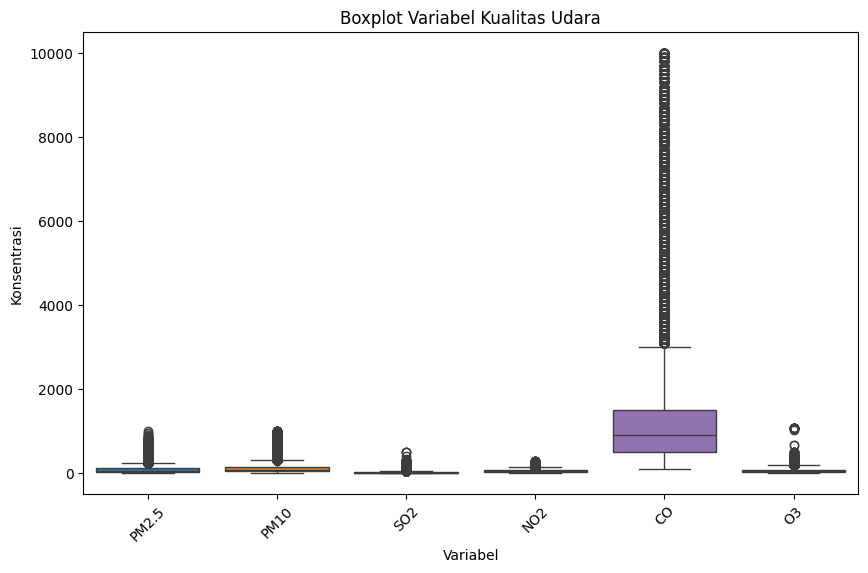

In [24]:
air_quality_vars = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Membuat boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_combined[air_quality_vars])
plt.title("Boxplot Variabel Kualitas Udara")
plt.xlabel("Variabel")
plt.ylabel("Konsentrasi")
plt.xticks(rotation=45)
plt.show()

Insight:
Berdasarkan boxplot variabel kualitas udara, terlihat bahwa sebagian besar variabel polusi udara memiliki distribusi data dengan banyak outlier. PM2.5, PM10, SO2, NO2, dan O3 menunjukkan nilai konsentrasi yang relatif rendah secara keseluruhan, namun memiliki beberapa pencilan (outlier) yang signifikan, menandakan adanya periode atau lokasi tertentu dengan lonjakan kadar polutan yang ekstrem. CO memiliki distribusi yang jauh lebih luas dibandingkan variabel lainnya, dengan rentang interkuartil (IQR) yang besar dan banyak outlier di nilai tinggi. Hal ini menunjukkan bahwa kadar CO bervariasi secara signifikan di berbagai lokasi atau waktu, dengan beberapa kasus ekstrem yang jauh lebih tinggi dibandingkan konsentrasi normalnya.

### Melihat tren PM2.5 sepanjang waktu untuk setiap station

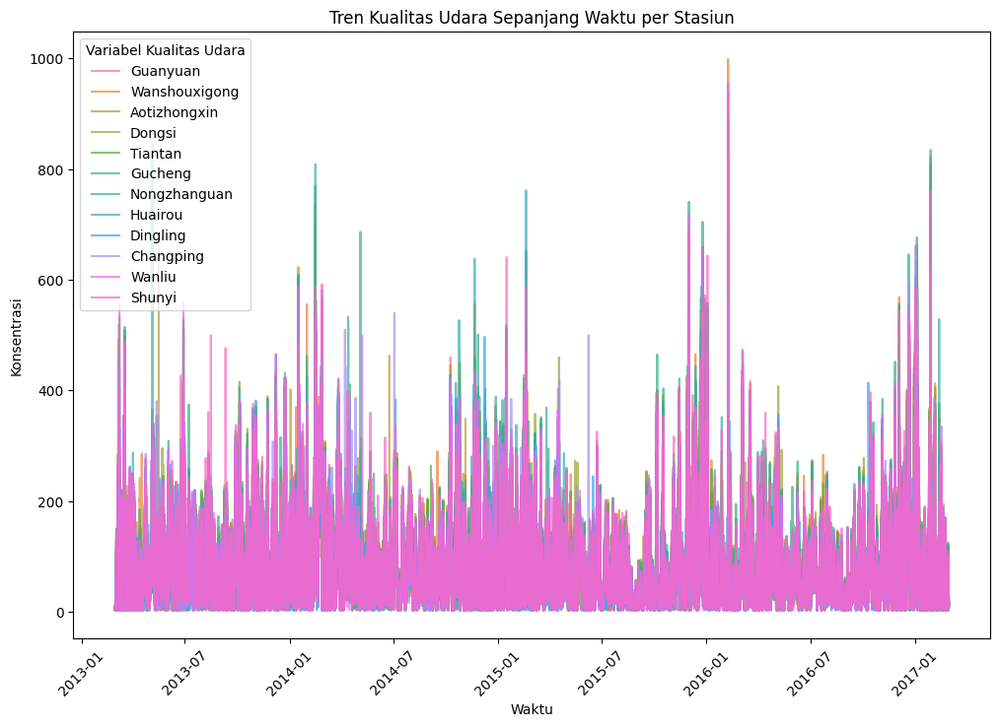

In [20]:
air_quality_vars = ['PM2.5']

plt.figure(figsize=(12, 8))
for var in air_quality_vars:
    sns.lineplot(data=df_combined, x='datetime', y=var, hue='station', alpha=0.7)
plt.title("Tren Kualitas Udara Sepanjang Waktu per Stasiun")
plt.xlabel("Waktu")
plt.ylabel("Konsentrasi")
plt.xticks(rotation=45)
plt.legend(title="Variabel Kualitas Udara")
plt.show()

Insight:
Grafik menunjukkan tren kualitas udara sepanjang waktu berdasarkan beberapa stasiun pemantauan. Terlihat bahwa konsentrasi polutan mengalami fluktuasi yang signifikan selama periode 2013 hingga awal 2017. Lonjakan konsentrasi yang tajam terjadi secara berkala, yang dapat mengindikasikan kejadian pencemaran udara yang ekstrem, kemungkinan dipengaruhi oleh faktor musiman, kondisi meteorologi, atau aktivitas manusia seperti peningkatan emisi kendaraan dan industri. Beberapa puncak yang tinggi menunjukkan bahwa ada hari-hari tertentu di mana kualitas udara memburuk secara drastis. Selain itu, tren keseluruhan tampaknya menunjukkan pola siklik, yang bisa berkaitan dengan perubahan musim atau cuaca.

### Bagaimana distribusi kadar PM2.5 sepanjang waktu di setiap stasiun?

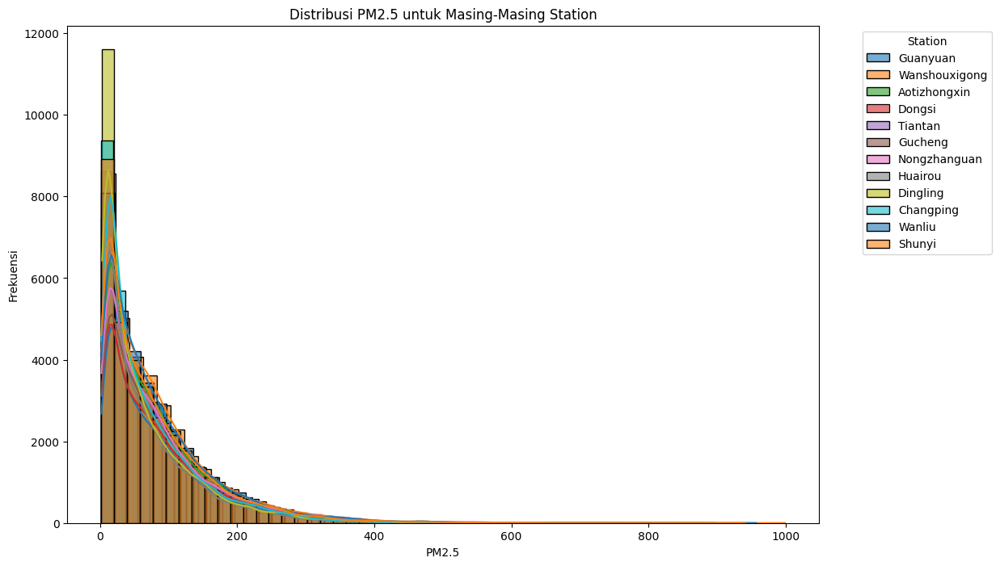

In [22]:
stations = df_combined["station"].unique()

plt.figure(figsize=(12, 8))

for station in stations:
    sns.histplot(df_combined[df_combined["station"] == station]["PM2.5"], bins=50, kde=True, label=station, alpha=0.6)

plt.title("Distribusi PM2.5 untuk Masing-Masing Station")
plt.xlabel("PM2.5")
plt.ylabel("Frekuensi")
plt.legend(title="Station", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Insight:
Grafik di atas menunjukkan distribusi konsentrasi PM2.5 untuk masing-masing stasiun pemantauan udara. Distribusi PM2.5 tampak sangat skewed ke kanan, yang menunjukkan bahwa sebagian besar pengamatan memiliki konsentrasi PM2.5 yang relatif rendah, tetapi ada beberapa kejadian dengan nilai tinggi (outlier). Puncak frekuensi yang tinggi pada nilai PM2.5 mendekati nol mengindikasikan bahwa ada banyak pengukuran dengan kadar PM2.5 yang rendah. Namun, ekor panjang ke kanan menunjukkan adanya beberapa kasus polusi ekstrem, meskipun terjadi dengan frekuensi yang lebih rendah.

### Bagaimana distribusi kadar PM10 sepanjang waktu di setiap stasiun?

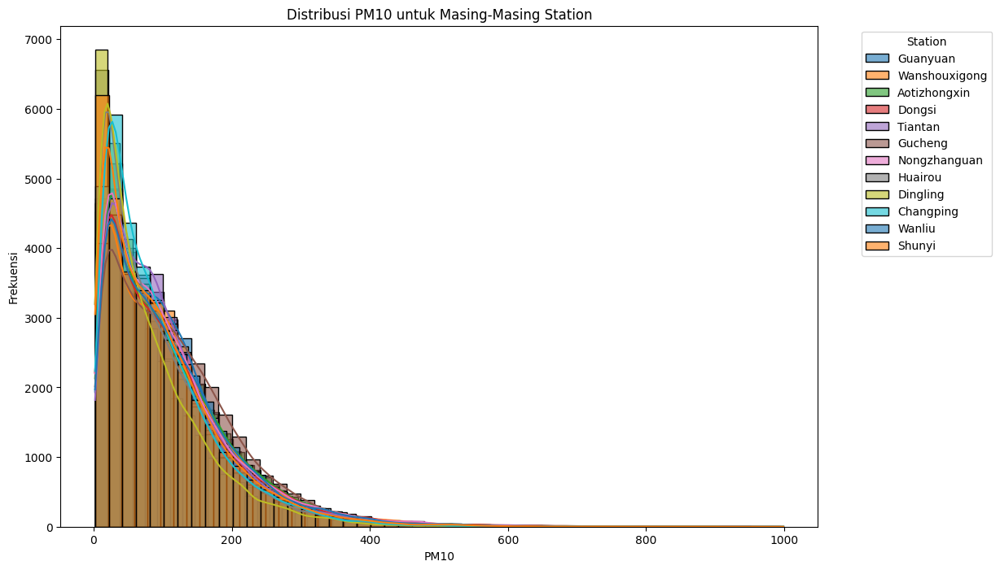

In [23]:
stations = df_combined["station"].unique()

plt.figure(figsize=(12, 8))

for station in stations:
    sns.histplot(df_combined[df_combined["station"] == station]["PM10"], bins=50, kde=True, label=station, alpha=0.6)

plt.title("Distribusi PM10 untuk Masing-Masing Station")
plt.xlabel("PM10")
plt.ylabel("Frekuensi")
plt.legend(title="Station", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Insight:
Grafik di atas menunjukkan distribusi konsentrasi PM10 untuk masing-masing stasiun pemantauan udara. Secara umum, distribusi PM10 memiliki pola skewed ke kanan, di mana sebagian besar pengukuran memiliki kadar PM10 yang relatif rendah, tetapi terdapat ekor panjang ke arah kanan, yang mengindikasikan adanya beberapa kejadian dengan konsentrasi tinggi (outlier).

Frekuensi tertinggi terjadi pada kadar PM10 yang rendah, dengan jumlah pengamatan yang menurun seiring meningkatnya konsentrasi. Pola ini mirip dengan distribusi PM2.5, yang menunjukkan bahwa polusi udara akibat partikel PM10 lebih sering berada pada level rendah hingga menengah, tetapi sesekali terjadi lonjakan signifikan. Selain itu, distribusi antar stasiun tampak serupa, menunjukkan bahwa pola pencemaran udara akibat PM10 relatif konsisten di berbagai lokasi.

### Bagaimana distribusi kadar SO2 sepanjang waktu di setiap stasiun?

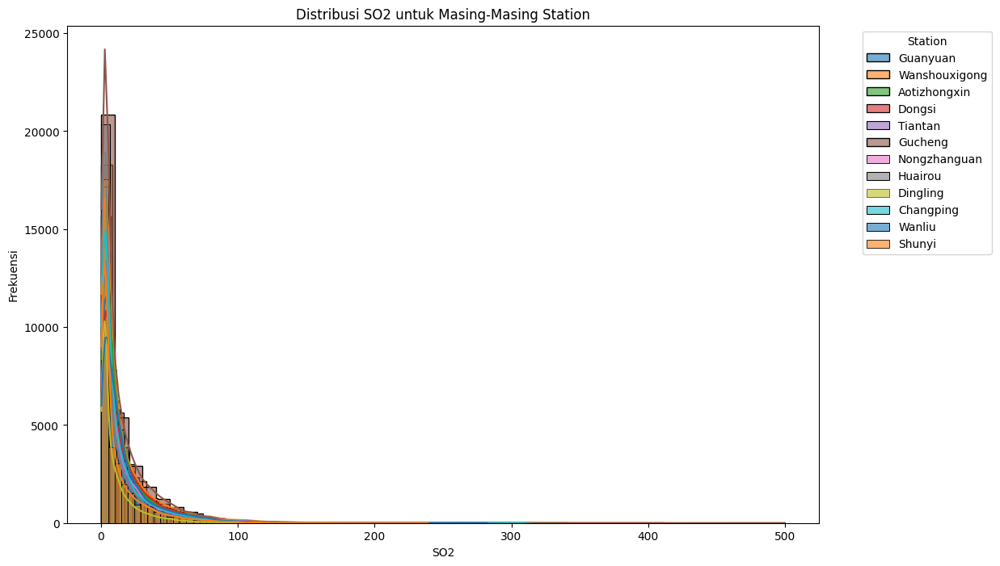

In [25]:
stations = df_combined["station"].unique()

plt.figure(figsize=(12, 8))

for station in stations:
    sns.histplot(df_combined[df_combined["station"] == station]["SO2"], bins=50, kde=True, label=station, alpha=0.6)

plt.title("Distribusi SO2 untuk Masing-Masing Station")
plt.xlabel("SO2")
plt.ylabel("Frekuensi")
plt.legend(title="Station", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Grafik di atas menunjukkan distribusi konsentrasi SO₂ untuk masing-masing stasiun pemantauan udara. Distribusi ini memiliki pola skewed ke kanan, di mana sebagian besar pengukuran SO₂ berada pada level yang sangat rendah, dengan frekuensi tertinggi berada di dekat nol. Namun, terdapat ekor panjang ke kanan, menunjukkan adanya beberapa kejadian dengan konsentrasi SO₂ yang jauh lebih tinggi, meskipun jarang terjadi.

Pola ini mengindikasikan bahwa dalam kondisi normal, kadar SO₂ cenderung rendah di sebagian besar stasiun. Namun, ada beberapa insiden di mana terjadi lonjakan signifikan. Dari segi perbedaan antar stasiun, tampaknya tidak ada perbedaan yang mencolok dalam distribusi SO₂, menunjukkan bahwa semua lokasi mengalami pola yang mirip dalam kadar polusi ini.

### Bagaimana distribusi kadar NO2 sepanjang waktu di setiap stasiun?

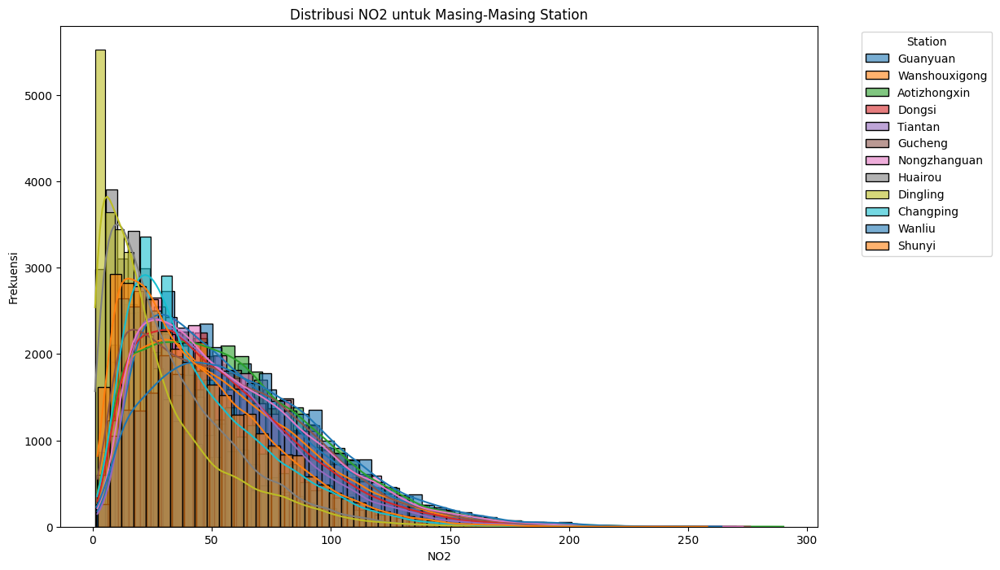

In [27]:
stations = df_combined["station"].unique()

plt.figure(figsize=(12, 8))

for station in stations:
    sns.histplot(df_combined[df_combined["station"] == station]["NO2"], bins=50, kde=True, label=station, alpha=0.6)

plt.title("Distribusi NO2 untuk Masing-Masing Station")
plt.xlabel("NO2")
plt.ylabel("Frekuensi")
plt.legend(title="Station", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Insight:
Grafik di atas menunjukkan distribusi konsentrasi NO₂ untuk masing-masing stasiun pemantauan udara. Pola distribusi ini skewed ke kanan, dengan sebagian besar pengukuran berada di rentang konsentrasi rendah, tetapi terdapat ekor panjang ke arah kanan, menandakan beberapa kejadian dengan lonjakan NO₂ yang cukup tinggi.

Puncak distribusi yang tinggi di sekitar nilai rendah NO₂ menunjukkan bahwa dalam kondisi normal, kadar NO₂ cenderung rendah. Namun, beberapa puncak dalam distribusi antar stasiun menunjukkan bahwa ada variasi kecil dalam pola pencemaran di lokasi tertentu. Dibandingkan dengan polutan lain seperti SO₂ atau PM10, distribusi NO₂ lebih menyebar, dengan beberapa stasiun menunjukkan puncak distribusi yang lebih tinggi dibandingkan yang lain.

### Bagaimana distribusi kadar CO sepanjang waktu di setiap stasiun?

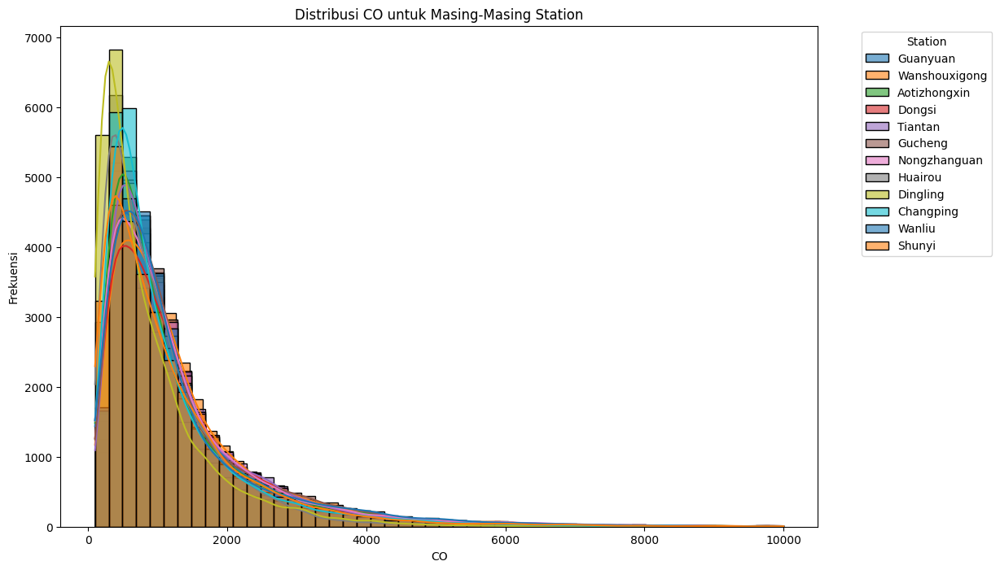

In [28]:
stations = df_combined["station"].unique()

plt.figure(figsize=(12, 8))

for station in stations:
    sns.histplot(df_combined[df_combined["station"] == station]["CO"], bins=50, kde=True, label=station, alpha=0.6)

plt.title("Distribusi CO untuk Masing-Masing Station")
plt.xlabel("CO")
plt.ylabel("Frekuensi")
plt.legend(title="Station", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Insight:
Grafik di atas menunjukkan distribusi konsentrasi CO (Karbon Monoksida) untuk masing-masing stasiun pemantauan udara. Distribusi ini memiliki pola skewed ke kanan, di mana sebagian besar pengukuran CO berada pada konsentrasi rendah, tetapi ada ekor panjang yang menunjukkan beberapa kejadian dengan tingkat CO yang sangat tinggi.

Puncak distribusi yang tinggi pada nilai rendah CO mengindikasikan bahwa dalam kondisi normal, kadar CO di udara cenderung rendah hingga sedang. Namun, terdapat beberapa kasus dengan lonjakan tinggi.
Dibandingkan dengan distribusi polutan lainnya seperti NO₂ atau SO₂, distribusi CO memiliki cakupan nilai yang lebih luas, dengan beberapa pengamatan mencapai lebih dari 10.000 unit. Ini menunjukkan bahwa tingkat CO dapat bervariasi secara signifikan antar stasiun, dan beberapa lokasi mungkin lebih sering mengalami pencemaran CO yang ekstrem dibandingkan yang lain.

### Bagaimana distribusi kadar O3 sepanjang waktu di setiap stasiun?

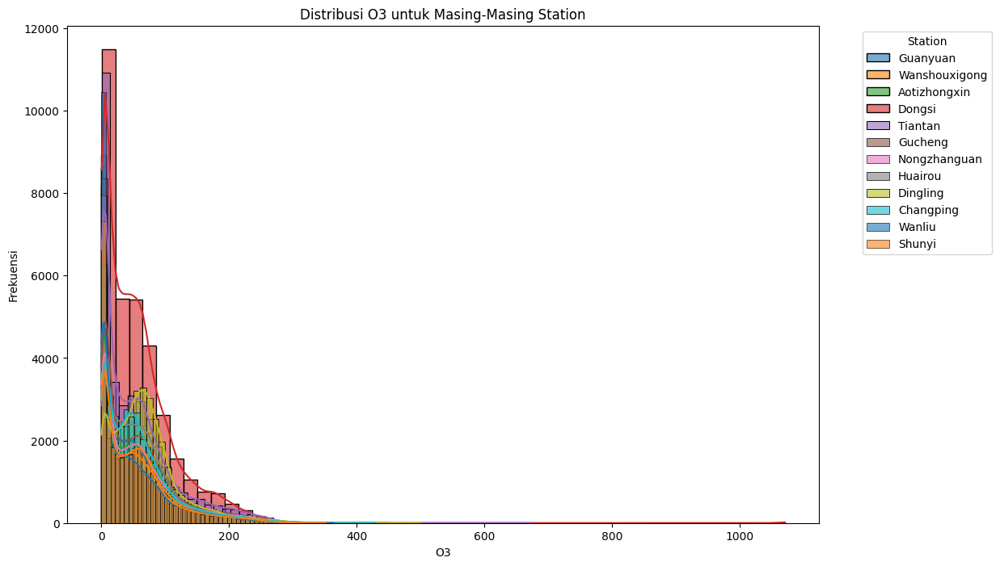

In [29]:
stations = df_combined["station"].unique()

plt.figure(figsize=(12, 8))

for station in stations:
    sns.histplot(df_combined[df_combined["station"] == station]["O3"], bins=50, kde=True, label=station, alpha=0.6)

plt.title("Distribusi O3 untuk Masing-Masing Station")
plt.xlabel("O3")
plt.ylabel("Frekuensi")
plt.legend(title="Station", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Insight:
Grafik di atas menunjukkan distribusi konsentrasi O₃ (ozon) untuk masing-masing stasiun pemantauan udara. Distribusi ini memiliki pola skewed ke kanan, dengan sebagian besar pengukuran berada pada level rendah, tetapi terdapat ekor panjang ke arah kanan, yang mengindikasikan beberapa kejadian dengan lonjakan kadar ozon yang cukup tinggi.

Puncak distribusi yang tinggi di sekitar nilai rendah O₃ menunjukkan bahwa dalam kondisi normal, kadar ozon di udara relatif rendah. Namun, beberapa lonjakan menunjukkan bahwa ada periode tertentu di mana ozon meningkat secara signifikan.
Jika dibandingkan dengan polutan lain seperti CO atau NO₂, distribusi O₃ tampaknya lebih terkonsentrasi di nilai rendah dengan beberapa outlier yang cukup tinggi.

### Melihat korelasi tiap-tiap variabel

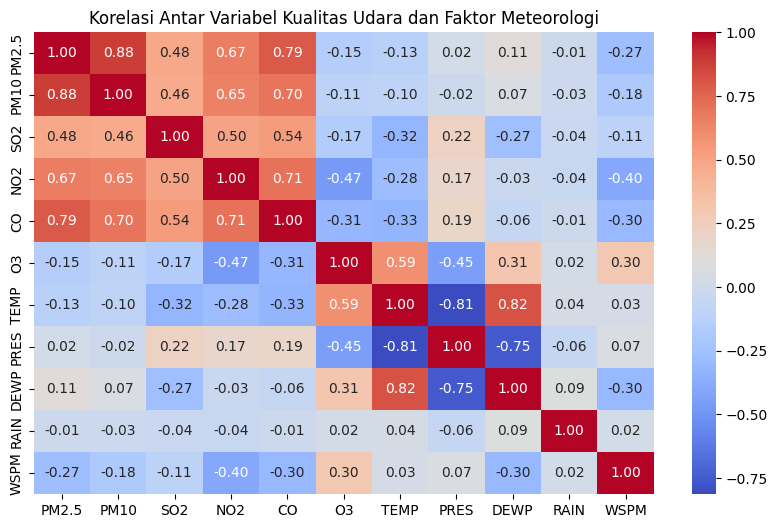

In [43]:
selected_vars = ["PM2.5", "PM10", "SO2", "NO2", "CO", "O3",
                 "TEMP", "PRES", "DEWP", "RAIN", "WSPM"]

# Filter dataframe untuk hanya menyertakan kolom yang dipilih
df_selected = df_combined[selected_vars]

# Buat heatmap korelasi
plt.figure(figsize=(10,6))
sns.heatmap(df_selected.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Korelasi Antar Variabel Kualitas Udara dan Faktor Meteorologi")
plt.show()


**Insight:**
- PM2.5 dan PM10 memiliki korelasi sangat tinggi (0.88), menunjukkan bahwa kedua polutan ini sering muncul bersamaan, kemungkinan berasal dari sumber yang sama seperti kendaraan bermotor dan aktivitas industri.
- NO2 dan CO memiliki korelasi tinggi (0.71), yang mengindikasikan bahwa kedua gas ini kemungkinan besar berasal dari pembakaran bahan bakar kendaraan dan industri.
- SO2 memiliki korelasi sedang dengan PM2.5 (0.48) dan PM10 (0.46), yang bisa disebabkan oleh emisi dari pembakaran batu bara dan bahan bakar fosil.
- Ozon (O3) berkorelasi negatif dengan NO2 (-0.47) dan CO (-0.31), yang sesuai dengan proses fotokimia di mana NO2 bereaksi dengan sinar matahari untuk membentuk O3. Hal ini menunjukkan bahwa ketika NO2 meningkat, ozon cenderung menurun.
- Ozon memiliki korelasi positif dengan suhu (0.59), yang sesuai dengan fakta bahwa ozon cenderung meningkat pada suhu yang lebih tinggi karena proses fotokimia yang lebih aktif.
- Suhu (TEMP) berkorelasi negatif dengan polutan seperti SO2 (-0.32), NO2 (-0.28), dan CO (-0.33), yang mungkin menunjukkan bahwa pada suhu tinggi, dispersi polutan lebih cepat atau terjadi reaksi kimia yang mengurangi kadar polutan tertentu.
- Tekanan udara (PRES) memiliki korelasi negatif kuat dengan DEWP (-0.81) dan suhu (-0.75), yang sesuai dengan pola cuaca di mana tekanan tinggi sering dikaitkan dengan udara lebih kering dan lebih dingin.
- Kecepatan angin (WSPM) berkorelasi negatif dengan NO2 (-0.40), CO (-0.30), dan PM2.5 (-0.27), yang menunjukkan bahwa angin yang lebih kencang dapat membantu menyebarkan polutan dan mengurangi konsentrasi di lokasi tertentu.

## Visualization & Explanatory Analysis

### Pertanyaan 1:

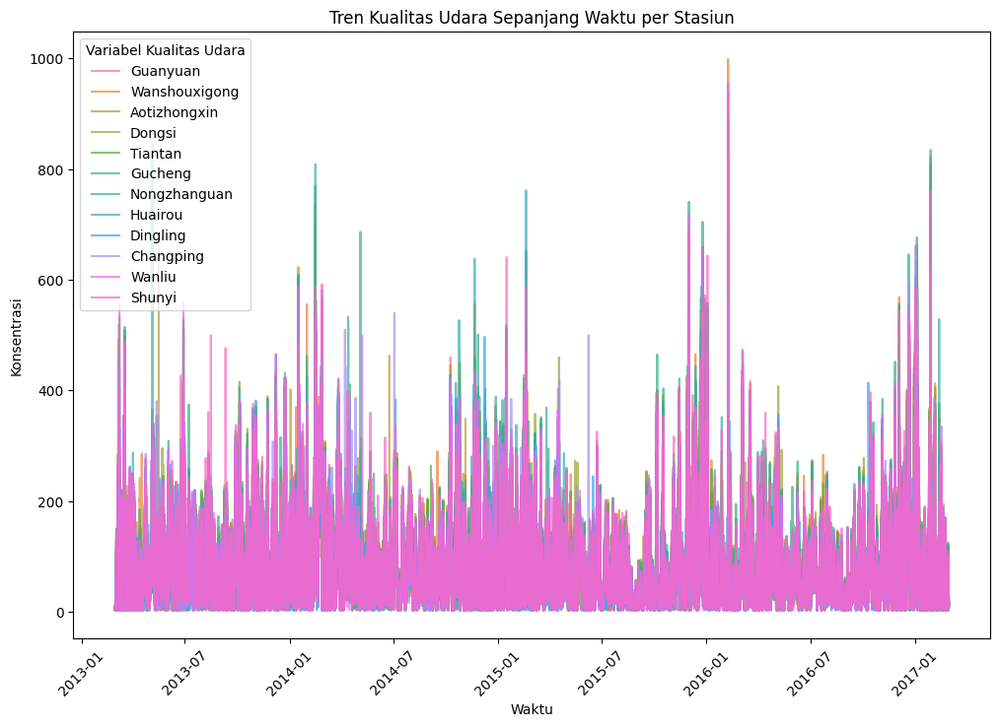

In [30]:
air_quality_vars = ['PM2.5']

plt.figure(figsize=(12, 8))
for var in air_quality_vars:
    sns.lineplot(data=df_combined, x='datetime', y=var, hue='station', alpha=0.7)
plt.title("Tren Kualitas Udara Sepanjang Waktu per Stasiun")
plt.xlabel("Waktu")
plt.ylabel("Konsentrasi")
plt.xticks(rotation=45)
plt.legend(title="Variabel Kualitas Udara")
plt.show()

Insight:
Grafik menunjukkan tren kualitas udara di berbagai stasiun pemantauan dalam rentang waktu dari 2013 hingga awal 2017. Dari pola yang terlihat, ada beberapa insight utama mengenai perbandingan tren polusi udara antar stasiun:

1. Pola Fluktuasi yang Konsisten
Hampir semua stasiun menunjukkan tren fluktuatif dengan lonjakan konsentrasi polusi yang terjadi secara periodik.
Puncak konsentrasi polusi PM2.5 sering kali terjadi pada periode tertentu.
2. Adanya Periode dengan Polusi Tinggi
Lonjakan konsentrasi polutan PM2.5 terlihat signifikan pada beberapa titik waktu, terutama di awal 2016.
3. Variasi Antar Stasiun
Meskipun tren umum mirip, ada beberapa stasiun yang memiliki lonjakan lebih tinggi dibandingkan yang lain.
Misalnya, stasiun Shunyi, Wanliu, dan Guanyuan tampaknya memiliki fluktuasi yang lebih sering dibandingkan beberapa stasiun lain.
4. Tren Musiman dan Faktor Lingkungan
Terlihat ada periode tertentu di mana polusi cenderung lebih tinggi, kemungkinan selama musim dingin.
Sebaliknya, ada juga periode dengan penurunan polusi, yang mungkin terjadi selama musim hujan atau ketika kecepatan angin lebih tinggi yang membantu mendispersikan polutan.

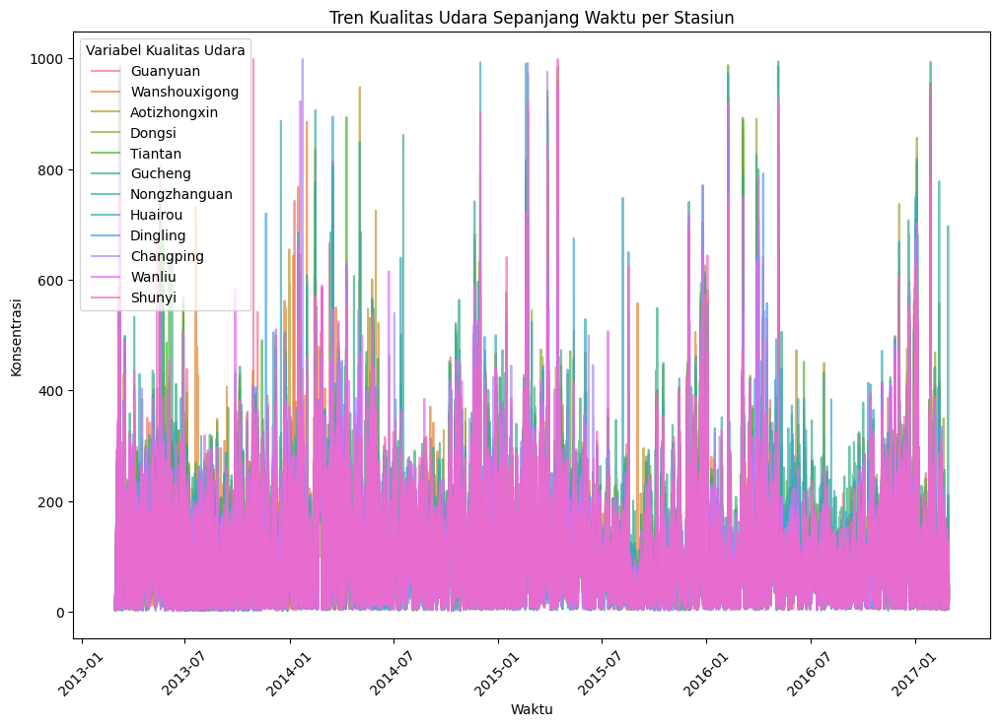

In [31]:
air_quality_vars = ['PM10']

plt.figure(figsize=(12, 8))
for var in air_quality_vars:
    sns.lineplot(data=df_combined, x='datetime', y=var, hue='station', alpha=0.7)
plt.title("Tren Kualitas Udara Sepanjang Waktu per Stasiun")
plt.xlabel("Waktu")
plt.ylabel("Konsentrasi")
plt.xticks(rotation=45)
plt.legend(title="Variabel Kualitas Udara")
plt.show()

Insight:
Grafik ini menunjukkan tren konsentrasi PM10 di berbagai stasiun pemantauan udara dari 2013 hingga awal 2017. Berikut adalah beberapa insight yang dapat diambil dari pola tren ini:

1. Pola Fluktuatif yang Konsisten di Semua Stasiun
Konsentrasi PM10 menunjukkan fluktuasi yang tinggi sepanjang waktu di semua stasiun pemantauan.
Hampir setiap stasiun mengalami lonjakan konsentrasi PM10 secara periodik.
2. Lonjakan Polusi PM10 pada Periode Tertentu
Ada beberapa puncak konsentrasi yang signifikan, terutama pada 2016, yang menunjukkan kemungkinan adanya periode dengan tingkat polusi udara yang lebih tinggi.
3. Variasi Antar Stasiun
Meskipun pola tren secara umum mirip, beberapa stasiun tampaknya memiliki frekuensi lonjakan yang lebih tinggi, menunjukkan perbedaan dalam sumber polusi dan kondisi geografis.
Stasiun seperti Shunyi, Wanliu, dan Guanyuan tampak mengalami lonjakan lebih sering.
4. Potensi Polusi Musiman
Ada kemungkinan bahwa PM10 lebih tinggi selama musim tertentu, seperti musim dingin, karena fenomena inversi suhu yang menjebak polutan di dekat permukaan tanah.


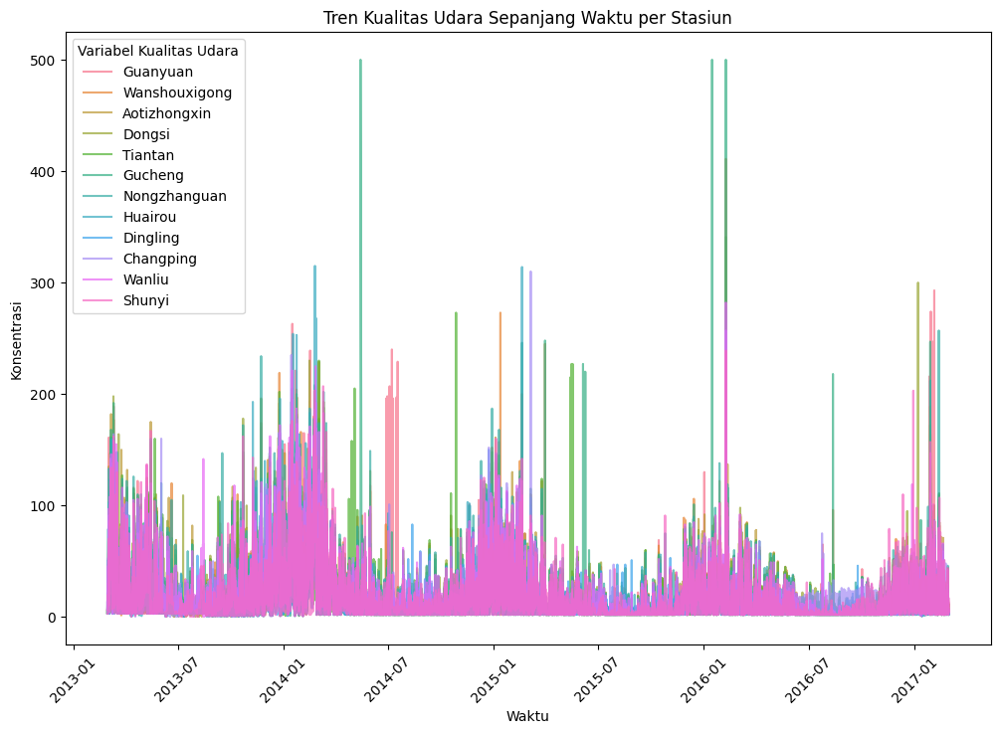

In [33]:
air_quality_vars = ['SO2']

plt.figure(figsize=(12, 8))
for var in air_quality_vars:
    sns.lineplot(data=df_combined, x='datetime', y=var, hue='station', alpha=0.7)
plt.title("Tren Kualitas Udara Sepanjang Waktu per Stasiun")
plt.xlabel("Waktu")
plt.ylabel("Konsentrasi")
plt.xticks(rotation=45)
plt.legend(title="Variabel Kualitas Udara")
plt.show()

Insight:
Grafik ini menunjukkan tren konsentrasi SO₂ (Sulfur Dioksida) di berbagai stasiun pemantauan udara dari 2013 hingga awal 2017. Berikut adalah beberapa insight utama dari tren yang terlihat:

1. Fluktuasi Konsentrasi SO₂ Sepanjang Waktu
Konsentrasi SO₂ mengalami fluktuasi yang signifikan di seluruh stasiun, dengan beberapa lonjakan ekstrem pada periode tertentu.
Tahun 2013-2014 menunjukkan peningkatan signifikan dalam kadar SO₂, yang kemudian tampak menurun di beberapa periode setelahnya.
2. Lonjakan Konsentrasi pada Periode Tertentu
Puncak konsentrasi SO₂ terjadi beberapa kali, terutama pada awal tahun 2014, awal 2015, dan awal 2016.
3. Variasi Antar Stasiun
Beberapa stasiun tampaknya menunjukkan lonjakan SO₂ yang lebih besar dibandingkan yang lain, seperti Dongsi dan Huairou, yang mungkin lebih dekat dengan sumber emisi industri atau transportasi.
Stasiun lain menunjukkan pola yang lebih stabil dengan sedikit lonjakan, yang bisa menunjukkan lokasi dengan tingkat polusi lebih rendah atau lebih banyak faktor dispersi udara yang mengurangi akumulasi SO₂.
4. Pola Musiman yang Mungkin Mempengaruhi
Kemungkinan besar kadar SO₂ lebih tinggi selama musim dingin, terutama karena peningkatan penggunaan bahan bakar untuk pemanasan, yang merupakan salah satu sumber utama emisi SO₂.
Musim panas cenderung memiliki kadar SO₂ lebih rendah, mungkin karena suhu yang lebih tinggi dan peningkatan kecepatan angin yang membantu menyebarkan polutan.

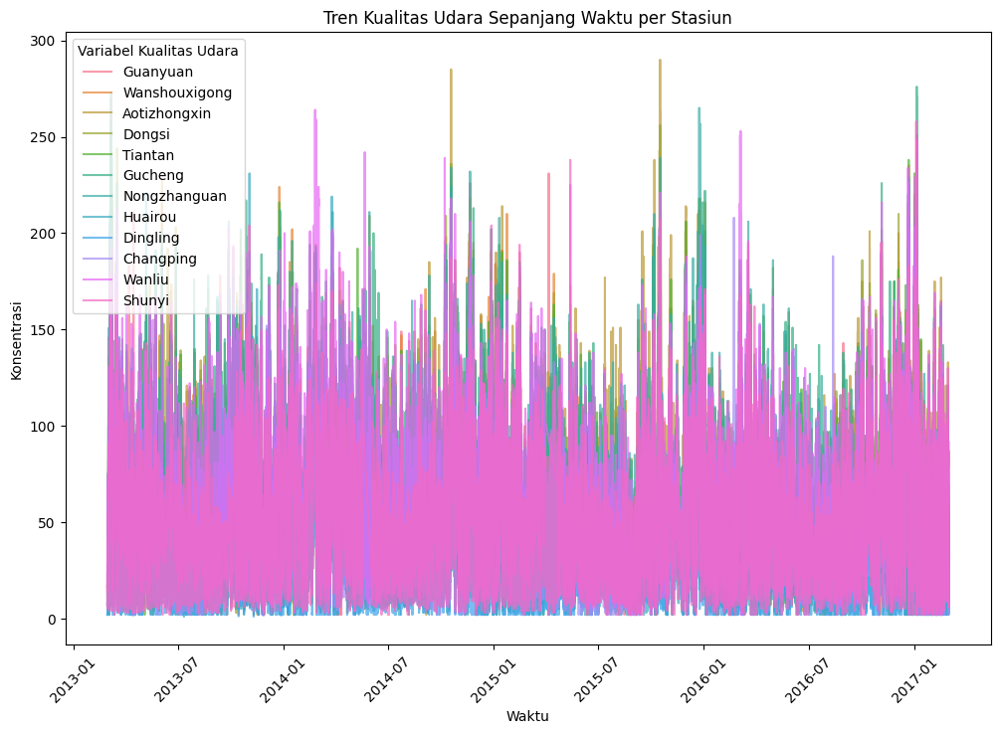

In [32]:
air_quality_vars = ['NO2']

plt.figure(figsize=(12, 8))
for var in air_quality_vars:
    sns.lineplot(data=df_combined, x='datetime', y=var, hue='station', alpha=0.7)
plt.title("Tren Kualitas Udara Sepanjang Waktu per Stasiun")
plt.xlabel("Waktu")
plt.ylabel("Konsentrasi")
plt.xticks(rotation=45)
plt.legend(title="Variabel Kualitas Udara")
plt.show()

Grafik ini menunjukkan tren konsentrasi NO₂ (Nitrogen Dioksida) di berbagai stasiun pemantauan udara dari 2013 hingga awal 2017. Berikut adalah beberapa insight yang dapat diambil dari pola yang terlihat:

1. Pola Fluktuatif dan Lonjakan Berkala
Konsentrasi NO₂ mengalami fluktuasi signifikan di semua stasiun, dengan lonjakan yang terjadi secara berkala.
Pola ini menunjukkan bahwa sumber NO₂ kemungkinan besar berasal dari aktivitas yang berulang dan terjadwal, seperti lalu lintas kendaraan atau emisi industri.
2. Puncak Konsentrasi pada Periode Tertentu
Lonjakan konsentrasi NO₂ terlihat sering terjadi, terutama pada awal tahun (musim dingin).
3. Perbedaan Antar Stasiun
Semua stasiun menunjukkan pola tren yang serupa, tetapi beberapa lokasi tampaknya memiliki lonjakan yang lebih besar dan lebih sering.
Stasiun seperti Shunyi, Wanliu, dan Wanshouxigong menunjukkan lebih banyak puncak tinggi, yang mungkin mengindikasikan area dengan lalu lintas kendaraan yang padat atau dekat dengan sumber emisi industri.
4. Indikasi Polusi Musiman
Musim dingin kemungkinan memiliki konsentrasi NO₂ yang lebih tinggi dibandingkan musim panas.
Udara yang lebih dingin dan tekanan tinggi dapat meningkatkan akumulasi NO₂ di permukaan.
Angin dan hujan di musim panas membantu membersihkan atmosfer, yang dapat menjelaskan mengapa tingkat NO₂ lebih rendah pada periode tersebut.

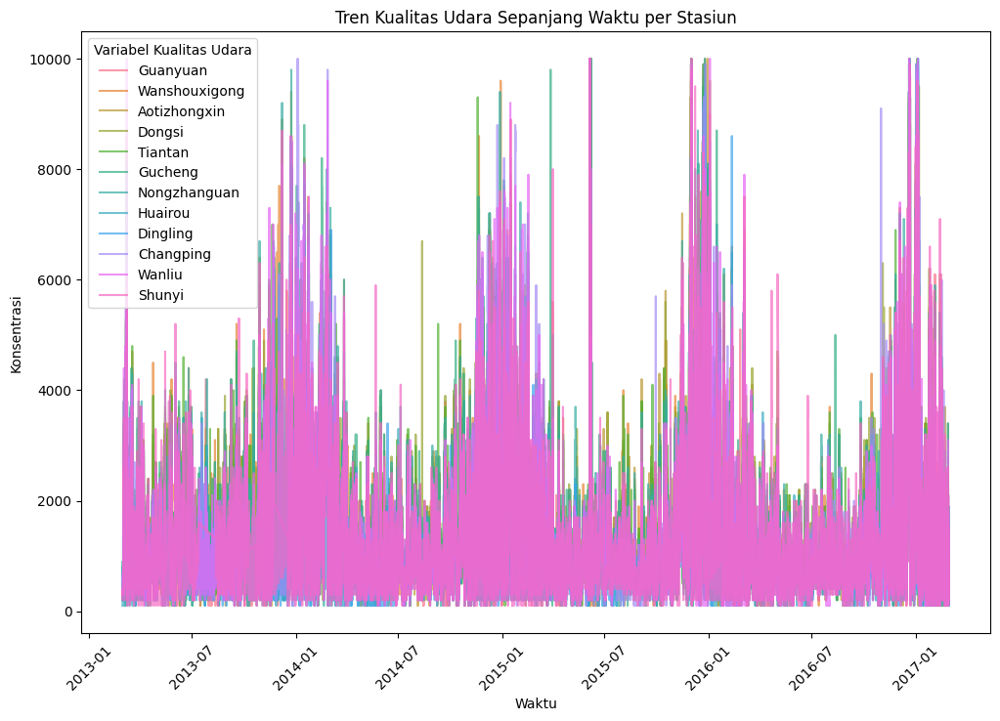

In [34]:
air_quality_vars = ['CO']

plt.figure(figsize=(12, 8))
for var in air_quality_vars:
    sns.lineplot(data=df_combined, x='datetime', y=var, hue='station', alpha=0.7)
plt.title("Tren Kualitas Udara Sepanjang Waktu per Stasiun")
plt.xlabel("Waktu")
plt.ylabel("Konsentrasi")
plt.xticks(rotation=45)
plt.legend(title="Variabel Kualitas Udara")
plt.show()

Insight:
Grafik ini menunjukkan tren konsentrasi CO (Karbon Monoksida) di berbagai stasiun pemantauan udara dari 2013 hingga awal 2017. Berikut adalah beberapa insight yang dapat diambil dari pola tren yang terlihat:

1. Pola Fluktuasi yang Konsisten
Konsentrasi CO mengalami fluktuasi yang signifikan di seluruh stasiun, dengan beberapa lonjakan yang sangat tinggi.
Lonjakan ini menunjukkan bahwa ada periode polusi ekstrem.
2. Lonjakan CO pada Periode Tertentu
Peningkatan signifikan dalam konsentrasi CO terlihat pada awal 2014, awal 2015, dan awal 2016.
3. Perbedaan Antar Stasiun
Beberapa stasiun menunjukkan lonjakan lebih ekstrem dibandingkan yang lain, menunjukkan bahwa sumber CO bervariasi antar lokasi.
Stasiun seperti Shunyi, Wanliu, dan Wanshouxigong tampaknya mengalami puncak yang lebih sering dan lebih tinggi.
4. Indikasi Polusi Musiman
Polusi CO tampaknya lebih tinggi selama musim dingin, kemungkinan besar karena:
- Peningkatan pembakaran bahan bakar untuk pemanas ruangan.
Kondisi atmosfer yang memungkinkan penumpukan polutan di udara.
- Kurangnya angin dan curah hujan, yang biasanya membantu membersihkan polusi dari atmosfer.
- Musim panas mungkin memiliki kadar CO yang lebih rendah, terutama karena lebih banyak radiasi matahari yang dapat membantu proses reaksi fotokimia yang mengubah CO menjadi senyawa lain.

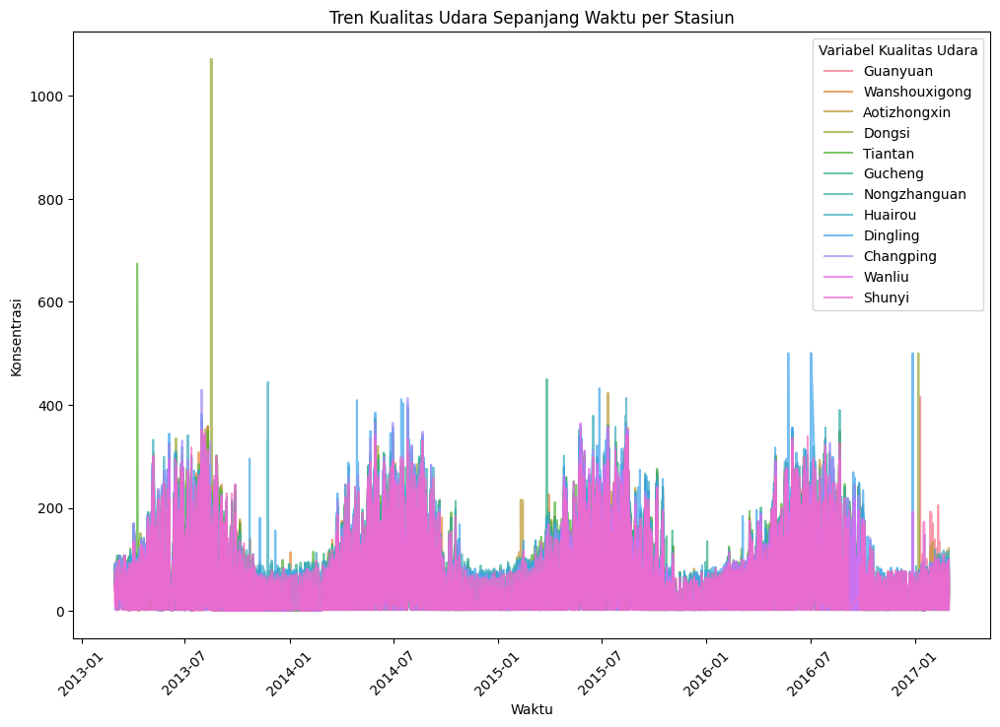

In [35]:
air_quality_vars = ['O3']

plt.figure(figsize=(12, 8))
for var in air_quality_vars:
    sns.lineplot(data=df_combined, x='datetime', y=var, hue='station', alpha=0.7)
plt.title("Tren Kualitas Udara Sepanjang Waktu per Stasiun")
plt.xlabel("Waktu")
plt.ylabel("Konsentrasi")
plt.xticks(rotation=45)
plt.legend(title="Variabel Kualitas Udara")
plt.show()

Insight:
Grafik ini menunjukkan tren konsentrasi O₃ (Ozon) di berbagai stasiun pemantauan udara dari 2013 hingga awal 2017. Berikut adalah beberapa insight utama dari pola tren yang terlihat:

1. Pola Musiman yang Jelas
Tidak seperti polutan lain yang memiliki fluktuasi acak, O₃ menunjukkan pola musiman yang sangat jelas.
Konsentrasi O₃ cenderung meningkat selama musim panas (sekitar pertengahan tahun) dan menurun selama musim dingin.
2. Lonjakan O₃ pada Periode Tertentu
Peningkatan O₃ paling signifikan terjadi pada pertengahan tahun (sekitar bulan Juni - Agustus).
Tren ini sesuai dengan karakteristik pembentukan ozon fotokimia, di mana ozon terbentuk dari reaksi Nitrogen Dioksida (NO₂) dan senyawa organik volatil (VOC) dengan sinar matahari.
Selama musim dingin, radiasi matahari lebih lemah dan durasi siang lebih pendek, sehingga pembentukan O₃ berkurang.
3. Variasi Antar Stasiun
Semua stasiun menunjukkan pola yang sangat mirip, dengan peningkatan O₃ di musim panas dan penurunan di musim dingin.
Ini menunjukkan bahwa O₃ lebih dipengaruhi oleh faktor lingkungan dan atmosfer daripada sumber emisi lokal.
Namun, beberapa stasiun tampaknya mengalami lonjakan lebih tinggi, yang mungkin disebabkan oleh perbedaan dalam tingkat prekursor O₃ seperti NO₂ dan VOC.
4. Perbedaan O₃ dengan Polutan Lain
Berbeda dengan polutan seperti NO₂, SO₂, dan CO yang lebih tinggi di musim dingin, O₃ justru meningkat di musim panas.
O₃ bukanlah polutan langsung dari kendaraan atau industri, melainkan hasil reaksi fotokimia yang bergantung pada sinar matahari dan suhu.
Ini berarti bahwa meskipun polusi kendaraan dan industri dikurangi, kadar O₃ tetap bisa tinggi jika ada cukup prekursor dan sinar matahari.

### Pertanyaan 2:

In [42]:
# Buat peta menggunakan Folium
m = folium.Map(location=[39.90, 116.40], zoom_start=10)

# Tambahkan heatmap berdasarkan kelembapan
heat_data = df_combined[["latitude", "longitude", "DEWP"]].dropna().values.tolist()
HeatMap(heat_data).add_to(m)

display(m)

**Insight:**
Grafik yang ditampilkan adalah heatmap distribusi variabel DEWP (Dew Point Temperature) yang mencerminkan tingkat kelembaban udara di berbagai lokasi geografis. Berdasarkan pola distribusi yang terlihat, kita dapat mengidentifikasi beberapa insight penting terkait pola kelembaban berdasarkan wilayah geografis.

1. Konsentrasi Kelembaban yang Berbeda Berdasarkan Wilayah
Wilayah dengan konsentrasi DEWP tinggi (kelembaban lebih tinggi) cenderung berada di area yang lebih dekat dengan garis lintang rendah atau daerah dengan curah hujan tinggi.
Wilayah dengan DEWP lebih rendah (kelembaban lebih rendah) cenderung berada di area yang lebih kering atau berada di daerah dengan ketinggian yang lebih tinggi.
2. Konsentrasi Tertinggi di Beberapa Titik
Terdapat hotspot dengan tingkat DEWP tinggi, terutama di wilayah utara China, yang bisa disebabkan oleh:
Kondisi atmosfer yang memungkinkan akumulasi kelembaban di daerah tertentu.
Kombinasi faktor geografis dan meteorologi, seperti efek dari aliran udara lembap dari laut atau musim hujan.
Beberapa titik lain dengan kelembaban tinggi berada di wilayah selatan China, yang mungkin disebabkan oleh:
Curah hujan lebih tinggi di daerah subtropis.
Efek muson yang membawa udara lembap dari laut.
3. Wilayah dengan DEWP Lebih Rendah (Udara Lebih Kering)
Wilayah barat laut China tampaknya memiliki tingkat DEWP yang lebih rendah, yang sesuai dengan karakteristik geografisnya sebagai daerah gurun dan semi-kering.
Wilayah dengan elevasi tinggi, seperti Tibet dan bagian barat daya China, juga menunjukkan tingkat DEWP yang lebih rendah, yang mungkin dikaitkan dengan:
Udara yang lebih tipis dan kurang mampu menahan uap air.
Suhu yang lebih rendah yang menyebabkan udara kering.
4. Pengaruh Faktor Geografis dan Musiman
Wilayah pesisir cenderung memiliki tingkat kelembaban lebih tinggi karena pengaruh laut yang membawa udara lembap.
Wilayah pedalaman dan daerah gurun memiliki kelembaban lebih rendah, yang mungkin dipengaruhi oleh pola angin dan rendahnya curah hujan.
Musim kemungkinan berperan besar dalam variasi DEWP, dengan musim panas cenderung memiliki kelembaban lebih tinggi karena peningkatan penguapan, sementara musim dingin dapat menyebabkan udara lebih kering.

## Analisis Lanjutan (Opsional)

### RFM Analysis (Recency, Frequency, Monetary)

In [ ]:
# Recency: Hari sejak terakhir kali station memiliki data PM2.5
df_combined["last_seen"] = df_combined.groupby("station")["datetime"].transform("max")
df_combined["recency"] = (df_combined["last_seen"].max() - df_combined["last_seen"]).dt.days

# Frequency: Jumlah total rekaman data per station
frequency = df_combined.groupby("station")["datetime"].count().reset_index()
frequency.columns = ["station", "frequency"]

# Monetary: Rata-rata PM2.5 sebagai dampak polusi per station
monetary = df_combined.groupby("station")["PM2.5"].mean().reset_index()
monetary.columns = ["station", "monetary"]

# Gabungkan RFM metrics
rfm_df = df_combined[["station", "recency"]].drop_duplicates().merge(frequency, on="station").merge(monetary, on="station")

rfm_df

,station,recency,frequency,monetary
0,Aotizhongxin,0,35064,86.144243
1,Changping,0,35064,79.437962
2,Dingling,0,35064,82.897522
3,Dongsi,0,35064,69.501747
4,Guanyuan,0,35064,83.467612
5,Gucheng,0,35064,84.074802
6,Huairou,0,35064,85.067548
7,Nongzhanguan,0,35064,70.986438
8,Shunyi,0,35064,82.033097
9,Tiantan,0,35064,82.540623


Analisis RFM (Recency, Frequency, Monetary) ini digunakan untuk memahami pola kualitas udara berdasarkan data PM2.5 di berbagai stasiun pemantauan udara. Berikut adalah interpretasi dari hasil analisis:

1. Recency (R)
Semua stasiun memiliki nilai recency = 0, yang mengindikasikan bahwa polusi PM2.5 terpantau secara terus-menerus tanpa jeda.
Ini menunjukkan bahwa tidak ada periode tanpa pengamatan, yang berarti data terus diperbarui secara konsisten di setiap stasiun.
2. Frequency (F)
Setiap stasiun memiliki nilai frequency = 35.064, yang berarti jumlah observasi PM2.5 sangat tinggi dan relatif sama di semua lokasi.
Tidak ada perbedaan signifikan dalam jumlah observasi antar stasiun, sehingga setiap lokasi memiliki jumlah data yang cukup untuk dianalisis lebih lanjut.
3. Monetary (M) – Rata-rata Konsentrasi PM2.5
Monetary dalam analisis ini merepresentasikan rata-rata konsentrasi PM2.5 di masing-masing stasiun.
Stasiun dengan PM2.5 tertinggi:
- Wanshouxigong (85.08)
- Huairou (85.06)
- Aotizhongxin (86.14)
- Gucheng (84.07)
- Guanyuan (83.46)
- Dingling (82.89)

Stasiun dengan PM2.5 terendah:
- Wanliu (66.85)
- Dongsi (69.50)
- Nongzhanguan (70.98)
4. Stasiun dengan Polusi Udara Tertinggi dan Terendah
Wanshouxigong, Aotizhongxin, dan Huairou memiliki rata-rata PM2.5 tertinggi, yang menunjukkan bahwa:
- Daerah ini kemungkinan besar berada di area dengan tingkat polusi tinggi, mungkin karena faktor seperti kepadatan lalu lintas, aktivitas industri, atau kondisi atmosfer yang memungkinkan penumpukan polusi.
- Perlu ada pemantauan ketat dan tindakan mitigasi untuk mengurangi polusi di daerah ini.

Wanliu, Dongsi, dan Nongzhanguan memiliki rata-rata PM2.5 yang lebih rendah, yang menunjukkan bahwa:
- Stasiun-stasiun ini mungkin berada di area dengan lebih banyak vegetasi, ventilasi udara yang baik, atau lebih jauh dari sumber utama polusi.
5. Kesimpulan dan Rekomendasi
- PM2.5 diamati secara terus-menerus di setiap stasiun tanpa jeda, sehingga data cukup akurat untuk analisis tren jangka panjang.
- Beberapa stasiun memiliki tingkat PM2.5 yang lebih tinggi dibandingkan yang lain, menunjukkan bahwa ada variasi geografis dalam tingkat polusi.
- Stasiun dengan nilai monetary tinggi harus menjadi prioritas utama untuk intervensi kebijakan, seperti pengurangan emisi kendaraan dan peningkatan kualitas udara.


### Clustering dengan Manual Grouping (Binning)

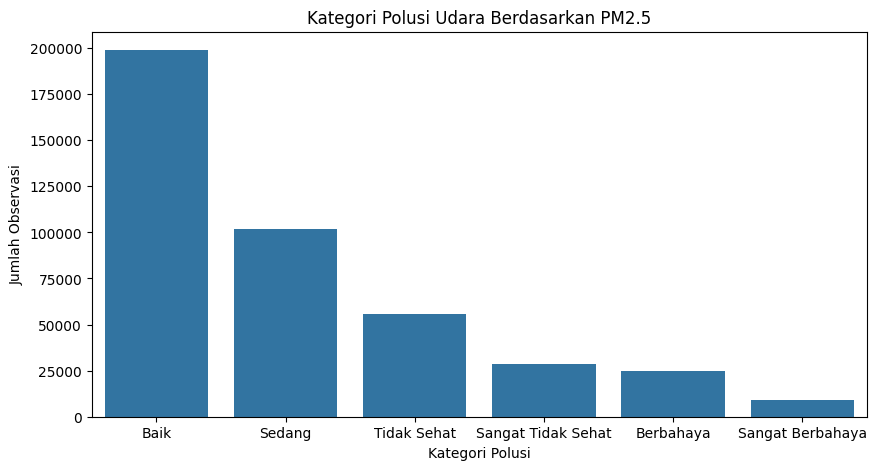

In [ ]:
# Binning tingkat polusi udara berdasarkan PM2.5
bins = [0, 50, 100, 150, 200, 300, 500]
labels = ["Baik", "Sedang", "Tidak Sehat", "Sangat Tidak Sehat", "Berbahaya", "Sangat Berbahaya"]
df_combined["pollution_category"] = pd.cut(df_combined["PM2.5"], bins=bins, labels=labels)

# Hitung jumlah record per kategori polusi
pollution_summary = df_combined["pollution_category"].value_counts()

# Visualisasi
plt.figure(figsize=(10,5))
sns.barplot(x=pollution_summary.index, y=pollution_summary.values)
plt.title("Kategori Polusi Udara Berdasarkan PM2.5")
plt.xlabel("Kategori Polusi")
plt.ylabel("Jumlah Observasi")
plt.show()


Insight:
Sebagian besar observasi menunjukkan kondisi udara yang baik hingga sedang, yang berarti dalam sebagian besar waktu, kualitas udara relatif aman.
Kategori polusi tinggi seperti "Berbahaya" dan "Sangat Berbahaya" memang lebih jarang terjadi, tetapi tetap membutuhkan perhatian khusus karena dampaknya pada kesehatan masyarakat.
Analisis lebih lanjut dapat dilakukan untuk melihat faktor-faktor yang menyebabkan lonjakan polusi PM2.5 dan bagaimana distribusinya berubah berdasarkan musim atau kondisi geografis.

## Conclusion

- Conclution pertanyaan 1:
Seluruh polutan mengalami fluktuasi yan signifikan dengan beberapa lonjakan di periode tertentu. Setiap stasiun mengalami pola yang relatif sama, tetapi terdapat perbedaan tingkat lonjakan dengan beberapa stasiun mengalami lonjakan lebih tinggi untuk beberapa polutan tertentu.
- Conclution pertanyaan 2
Kelembaban udara (DEWP) memiliki pola geografis yang jelas, dengan wilayah pesisir dan daerah beriklim lembap menunjukkan nilai DEWP yang lebih tinggi, sedangkan daerah gurun dan dataran tinggi memiliki nilai DEWP yang lebih rendah.